**Название проекта:**

Исследования рынка общепита в Москве для принятия решения об открытии нового заведения

**Цель исследования:**

Поиск интересных особенностей рынка Москвы, которые в будущем помогут в выборе подходящего инвесторам места.

**Ход исследования:**
1. Загрузка данных и подготовка их к анализу
2. Предобработка данных
3. Анализ данных
4. Детализация исследования
5. Выводы
6. Презентация

**Краткое описание проекта:**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

**Описание начальных данных:**

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  «Средний счёт: 1000–1500 ₽»;
  «Цена чашки капучино: 130–220 ₽»;
  «Цена бокала пива: 400–600 ₽».
  и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.


# 1. Загрузка данных и подготовка их к анализу

## Обзор данных

In [1]:
# импортируем необходимые библиотеки
import pandas as pd
import numpy as np
import seaborn as sns
from numpy import median
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import plotly.express as px
import folium
import json
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [2]:
# загружаем данные
df = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
# откроем таблицу df и посмотрим общую информацию о ней
df.info()
df.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


**Обнаруженные проблемы:**

В нашем распоряжении 8406 строк для анализа, по ряду из них отсутствует информация. 
- пропуски в шести столбцах. Возможно пропуски информации связаны с отсутствием официально подтвержденных данных (информация не добавлена пользователями или не найдена в общедоступных источниках), либо система сбора информации дала сбой. 
- в столбце seats необходимо заменить тип данных с float на int
- в столбце name есть значения записанные по-разному: с использованием заглавных и строчных букв. Приведем их к нижнему регистру и проверим на наличие дубликатов
- необходимо добавить столбец street с названиями улиц и столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

# 2. Предобработка данных

## Анализ выбросов и аномалий в данных

In [4]:
# посмотрим на список характерных значений
df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


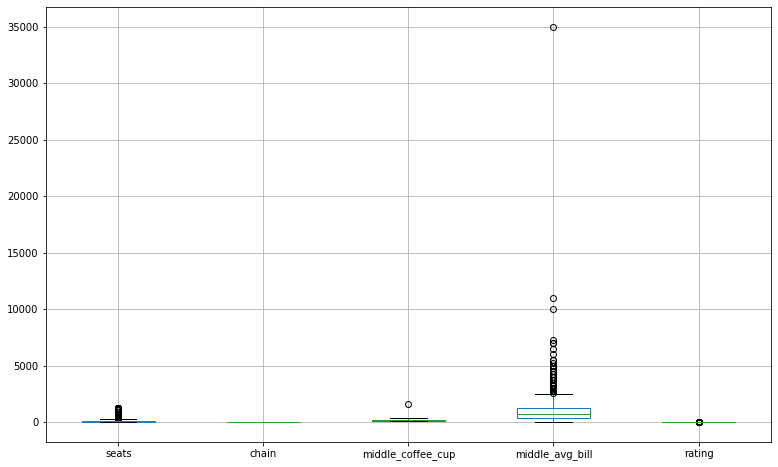

In [5]:
# чтобы изучить особенности визуально, построим коробчатую диаграмму
plt.figure(figsize=(13, 8))
df.boxplot(column=['seats','chain', 'middle_coffee_cup', 'middle_avg_bill', 'rating']);

Обнаружен выброс в столбце 'middle_avg_bill' со значением более 35 тыс. Возможно это очень дорогой ресторан, а может - аномалия. Данный выброс будет искажать исследование, и т.к. это одна запись, удалим ее.

In [6]:
# найдем индекс с чеком в 35 тыс.
df['middle_avg_bill'].sort_values(ascending=False).head(5)

7177    35000.0
730     11000.0
5481    10000.0
3882     7250.0
3487     7000.0
Name: middle_avg_bill, dtype: float64

In [7]:
# удалим выброс
df=df.query('index not in [7177]')

## Работа с пропусками

In [8]:
# проверим данные на наличие пропусков
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7870
chain                   0
seats                3611
dtype: int64

In [9]:
# проверим данные на наличие пропусков в %
pd.DataFrame(round(df.isna().mean()*100)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


Обнаружены пропуски в шести столбцах с долей от 6% до 94% от общего объема наблюдений в них. Обработка пропусков в данных столбцах через замену на ноль, среднее или медиану невозможна, т.к. может сильно исказить реальную картину и в итоге негативно повлияет на результаты исследования. Заведения даже на одной улице могут сильно отличаться по графику работы или среднему чеку. Заменим пропуски в данных столбцах на "заглушки".

In [10]:
#  заменим пропуски в столбце hours на 'Нет данных'
df['hours'] = df['hours'].fillna('Нет данных')

In [11]:
#  заменим пропуски в столбце price на 'Нет данных'
df['price'] = df['price'].fillna('Нет данных')

In [12]:
#  заменим пропуски в столбце avg_bill на 'Нет данных'
df['avg_bill'] = df['avg_bill'].fillna('Нет данных')

In [13]:
#  заменим пропуски в столбце middle_avg_bill на заглушку 999999
df['middle_avg_bill'] = df['middle_avg_bill'].fillna(999999)

In [14]:
#  заменим пропуски в столбце middle_coffee_cup на заглушку 999999
df['middle_coffee_cup'] = df['middle_coffee_cup'].fillna(999999)

In [15]:
#  заменим пропуски в столбце seats на заглушку 999999
df['seats'] = df['seats'].fillna(999999)

## Изменение типов данных

In [16]:
# замeним тип данных в столбце seats
df['seats'] = df['seats'].astype('int')

## Работа с дубликатами

In [17]:
# проверим данные на наличие дубликатов
df.duplicated().sum()

0

**Обработка столбца "name"**

In [18]:
# выведем перечень уникальных значений в названиях заведений
df['name'].sort_values(ascending=False).head(30).unique()

array(['ночной Баку', 'Яуза', 'Ясно', 'Ясмин', 'Яръ', 'Ярославский',
       'Ярославна', 'Ярмарка морских блюд', 'Яркофе', 'Япоша',
       'Японский пёс', 'Японский король', 'Японские традиции',
       'Японская кухня', 'ЯпонаМать', 'Янтарь', 'Янис', 'Яндекс.Лавка',
       'Яндекс Лавка'], dtype=object)

In [19]:
# приведем все символы к нижнему регистру
df['name'] = df['name'].str.lower()

In [20]:
# удалим пробелы в начале и конце строки
df['name'] = df['name'].str.strip()

In [21]:
# заменим ё на е
replace_values = {'ё':'е'}
df = df.replace({'name': replace_values})
df['name'] = df['name'].replace(['ё'],['е'],regex=True)

In [22]:
# удалим символы
df['name'] = df['name'].replace({
    "яндекс.лавка": "яндекс лавка"
})

In [23]:
# проверим
df['name'].sort_values(ascending=False).head(30).unique()

array(['яуза', 'ясно', 'ясмин', 'яръ', 'ярославский', 'ярославна',
       'ярмарка морских блюд', 'яркофе', 'япоша', 'японский пес',
       'японский король', 'японские традиции', 'японская кухня',
       'японамать', 'янтарь', 'янис', 'яндекс лавка'], dtype=object)

**Обработка столбца "address"**

In [24]:
# выведем перечень уникальных значений в адресах
df['address'].sort_values(ascending=False).head(30).unique()

array(['Москва, № 7', 'Москва, шоссе Энтузиастов, с2',
       'Москва, шоссе Энтузиастов, 86А, корп. 3',
       'Москва, шоссе Энтузиастов, 86, стр. 7',
       'Москва, шоссе Энтузиастов, 86, стр. 6',
       'Москва, шоссе Энтузиастов, 66/1', 'Москва, шоссе Энтузиастов, 64',
       'Москва, шоссе Энтузиастов, 62',
       'Москва, шоссе Энтузиастов, 56, стр. 44',
       'Москва, шоссе Энтузиастов, 53', 'Москва, шоссе Энтузиастов, 52',
       'Москва, шоссе Энтузиастов, 51', 'Москва, шоссе Энтузиастов, 31М',
       'Москва, шоссе Энтузиастов, 31',
       'Москва, шоссе Энтузиастов, 3, корп. 2',
       'Москва, шоссе Энтузиастов, 3, корп. 1',
       'Москва, шоссе Энтузиастов, 24/43',
       'Москва, шоссе Энтузиастов, 22/18',
       'Москва, шоссе Энтузиастов, 20', 'Москва, шоссе Энтузиастов, 19',
       'Москва, шоссе Энтузиастов, 12к2',
       'Москва, шоссе Энтузиастов, 12, корп. 2'], dtype=object)

In [25]:
# приведем все символы к нижнему регистру
df['address'] = df['address'].str.lower()

In [27]:
# проверим
df['address'].sort_values(ascending=False).head(30).unique()

array(['москва, № 7', 'москва, яузский бульвар, 14/8',
       'москва, яузский бульвар, 11, стр. 1',
       'москва, яузская улица, 8с2', 'москва, яузская улица, 5',
       'москва, яузская улица, 11/6к5', 'москва, яузская улица, 11/6к4',
       'москва, яузская улица, 10/2с4', 'москва, яузская улица, 1/15с1',
       'москва, ясногорская улица, 21, корп. 1',
       'москва, ясногорская улица, 17, корп. 1',
       'москва, ясеневая улица, 41а', 'москва, ясеневая улица, 40',
       'москва, ясеневая улица, 29',
       'москва, ясеневая улица, 19, корп. 1',
       'москва, ясеневая улица, 13',
       'москва, ясеневая улица, 12, корп. 5',
       'москва, ясеневая улица, 12, корп. 1',
       'москва, ясеневая улица, 10, корп. 1',
       'москва, ярцевская улица, 34, корп. 2',
       'москва, ярцевская улица, 33, корп. 1',
       'москва, ярцевская улица, 32', 'москва, ярцевская улица, 31'],
      dtype=object)

In [28]:
# проверим наличие дубликатов по сочетанию адреса и названия
key = ['name', 'address']
df.groupby(key)['name'].count().sort_values(ascending=False).head(10)

name                       address                                  
раковарня клешни и хвосты  москва, проспект мира, 118                   2
кафе                       москва, парк ангарские пруды                 2
хлеб да выпечка            москва, ярцевская улица, 19                  2
more poke                  москва, волоколамское шоссе, 11, стр. 2      2
#кешбэккафе                москва, большая татарская улица, 11с         1
на углу                    москва, улица рогожский вал, 5, стр. 1       1
на нагатинской             москва, нагатинская улица, 2, корп. 2        1
на ночь жрать              москва, 3-я парковая улица, 57               1
на ордынке                 москва, улица большая ордынка, 62, стр. 1    1
на перекус                 москва, снежная улица, 26                    1
Name: name, dtype: int64

Получаем в результате 4 дублирующиеся записи.

In [29]:
# удалим повторяющиеся записи 
key = ['name', 'address']
df = df.drop_duplicates(subset=key)

## Работа с дополнительными столбцами

In [30]:
# добавим столбец street с названиями улиц
df['street'] = df['address'].str.split(', ').apply(lambda x: x[1])

In [31]:
# добавим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
df['is_24/7'] = df['hours'].str.contains('ежедневно', 'круглосуточно')

## Проверка изменений

In [32]:
# перепроверим чтобы все изменения "подтянулись" корректно
df.info()
df.head(5)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8401 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8401 non-null   object 
 1   category           8401 non-null   object 
 2   address            8401 non-null   object 
 3   district           8401 non-null   object 
 4   hours              8401 non-null   object 
 5   lat                8401 non-null   float64
 6   lng                8401 non-null   float64
 7   rating             8401 non-null   float64
 8   price              8401 non-null   object 
 9   avg_bill           8401 non-null   object 
 10  middle_avg_bill    8401 non-null   float64
 11  middle_coffee_cup  8401 non-null   float64
 12  chain              8401 non-null   int64  
 13  seats              8401 non-null   int64  
 14  street             8401 non-null   object 
 15  is_24/7            8401 non-null   bool   
dtypes: bool(1), float64(5), 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,Нет данных,Нет данных,999999.0,999999.0,0,999999,улица дыбенко,True
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,999999.0,0,4,улица дыбенко,True
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,999999.0,0,45,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,Нет данных,Цена чашки капучино:155–185 ₽,999999.0,170.0,0,999999,улица маршала федоренко,True
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,999999.0,1,148,правобережная улица,True


# 3. Анализ данных

## Количество объектов общественного питания по категориям

In [33]:
category_cnt = (df.groupby('category')['name'].agg('count').sort_values(ascending=False).to_frame().reset_index())
category_cnt

,category,name
0,кафе,2376
1,ресторан,2041
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [34]:
# строим столбчатую диаграмму 
fig = px.bar(category_cnt.sort_values(by='name', ascending=True), # загружаем данные и заново их сортируем
             x='name', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='name' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество заведений по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категории')

# выводим график
fig.show() 

Как видим, более 50% из представленных точек общественного питания занимают кафе (2376) и рестораны (2042). Далее идут кофейни (почти 1413). Все остальные категории имеют менее 1000 заведений.

## Количество посадочных мест в местах по категориям

In [35]:
# исследуем количество количество посадочных мест в местах по категориям
# отфильтруем датасет от "заглушек"
seats = df.query('seats != 999999')
seats_cnt = (seats.groupby('category')['seats'].agg('median').sort_values(ascending=False).to_frame().reset_index())
seats_cnt

,category,seats
0,ресторан,86.0
1,"бар,паб",82.0
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


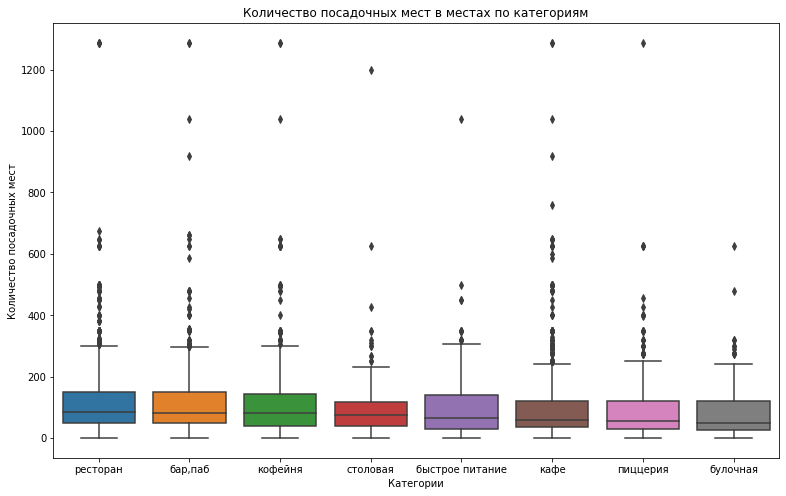

In [36]:
# построим график «ящик с усами» 
c=['ресторан','бар,паб','кофейня','столовая','быстрое питание','кафе','пиццерия','булочная']
data_temp, y = seats, 'seats'
plt.figure(figsize=(13, 8))
(sns.boxplot(data = data_temp, y = y, x='category', order=c)
    .set(title = 'Количество посадочных мест в местах по категориям', xlabel = 'Категории', ylabel = 'Количество посадочных мест'));

График «ящик с усами» показывает распределение данных в наборе, в нашем случае это количество посадочных мест. Видим, что наибольшее значение распологается в районе ~300 мест. Медиана категорий: ресторан, бар/паб, столовая и кофейня, находится на уровне ~100 мест. Все остальные - ниже. У кафе (самая популярная категория заведений) на уровне ~ 75-80 мест. 

In [37]:
# найдем перцентили посадочных мест
perc = np.percentile(seats['seats'], [50,95])

print(f' у 50 % заведений более {perc[0]} посадочных мест,\n '
      f'у 5 % заведений более {perc[1]} посадочных мест, ')

 у 50 % заведений более 75.0 посадочных мест,
 у 5 % заведений более 307.0 посадочных мест, 


У 50% заведений в расположении не более 75 посадочных мест. Стоит отметить, как ранее увидели на графике, не более 5% заведений выходит за отметку более 307 посадочных мест.

## Cоотношение сетевых и несетевых заведений

In [38]:
# рассмотрим соотношение сетевых и несетевых заведений в датасете
chain_ratio = df.pivot_table(index='chain', values='name', aggfunc='count')
chain_ratio['ratio'] = round(chain_ratio['name']/chain_ratio['name'].sum(),2)
chain_ratio

,name,ratio
chain,,
0,5198,0.62
1,3203,0.38


In [39]:
# построим график
name_chain = ['не сеть', 'сеть']

fig = go.Figure(data=[go.Pie(labels=name_chain, # указываем значения, которые появятся на метках сегментов
                            values=chain_ratio['ratio'], # указываем данные, которые отобразятся на графике
                            pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Cоотношение сетевых и несетевых заведений', # указываем заголовок графика
                 width=500, # указываем размеры графика
                 height=500,
                 annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                   y=1.05,
                                   text='Тип заведения',
                                   showarrow=False)])
fig.show() # выводим график



Как видим доля не сетевых заведений превалирует и составляет 62%.

## Категории сетевых заведений

In [40]:
# рассмотрим какие категории заведений являются сетевыми и не сетевыми
chain_cnt_2 = df.pivot_table(index='chain', columns = 'category', values='name', aggfunc='count')
chain_cnt_2

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
chain,,,,,,,,
0,596,99,371,1597,693,303,1312,227
1,168,157,232,779,720,330,729,88


In [41]:
chain_cnt_3 = df.groupby(['category', 'chain'])['name'].agg('count').reset_index()
chain_cnt_3 = chain_cnt_3.rename(columns={'name': 'chain_cnt'})
ratio = (pd.merge(chain_cnt_3, category_cnt, on='category')
          .assign(frac = lambda x: x['chain_cnt'] / x['name'] * 100)
          .sort_values(by=['chain','chain_cnt'], ascending=True)

)
ratio

,category,chain,chain_cnt,name,frac
2,булочная,0,99,256,38.671875
14,столовая,0,227,315,72.063492
10,пиццерия,0,303,633,47.867299
4,быстрое питание,0,371,603,61.525705
0,"бар,паб",0,596,764,78.010471
8,кофейня,0,693,1413,49.044586
12,ресторан,0,1312,2041,64.282215
6,кафе,0,1597,2376,67.213805
15,столовая,1,88,315,27.936508
3,булочная,1,157,256,61.328125


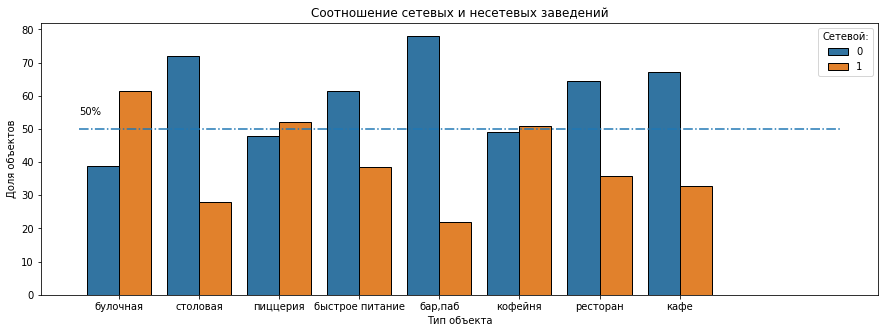

In [42]:
# строим график
plt.figure(figsize=(15, 5))

ax = sns.barplot(x='category', 
                 y='frac', 
                 hue='chain', 
                 data=ratio
                 )

for patch in ax.patches:
    patch.set_edgecolor('black')

plt.title('Соотношение сетевых и несетевых заведений')
plt.ylabel('Доля объектов')
plt.xlabel('Тип объекта')
plt.legend(title='Сетевой:')
plt.hlines(y=50, xmin=-0.5, xmax=9, linestyle='dashdot', label='50%')
plt.text(-0.5, 55, '50%', ha='left', va='center')
plt.show()

Категории заведений, в которых превалирует тип "сеть": булочная, кофейня, пиццерия.

## ТОП-15 популярных сетей в Москве

В нашем случае популярность сети будет определять количество ее объектов.

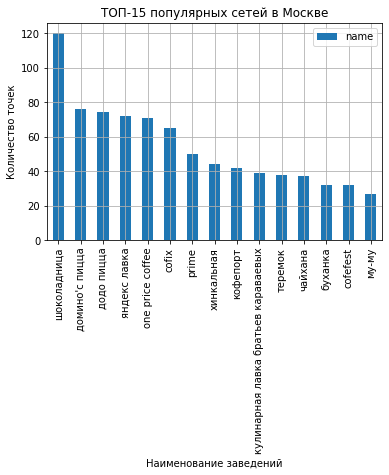

In [43]:
# строим график ТОП-15 популярных сетей 
chain_plus = df.query('chain == 1')
top_15_name= chain_plus['name'].value_counts().head(15).to_frame()

top_15_name.plot(kind='bar')
plt.title('ТОП-15 популярных сетей в Москве')
plt.xlabel('Наименование заведений')
plt.ylabel('Количество точек')

# добавляем сетку
plt.grid()

# отображаем график
plt.show()


In [44]:
# строим график категорий по ТОП-15 популярных сетей 
top_15_chains = list(df[df.chain==1]['name'].value_counts()[:15].index)
top_15_chains_df = df[df.name.isin(top_15_chains)]

first_row_top_15_chains_df = top_15_chains_df.drop_duplicates(subset=['name'])
type_chains = first_row_top_15_chains_df['category'].value_counts()

# построим график
name_category = ['кофейня', 'кафе', 'ресторан','пиццерия','булочная','быстрое питание']
fig = go.Figure(data=[go.Pie(labels=name_category, values=type_chains, # указываем значения, которые появятся на метках сегментов
                            pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Категории ТОП-15 популярных сетей', # указываем заголовок графика
                 width=600, # указываем размеры графика
                 height=600,
                 annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                   y=1.05,
                                   text='Категория',
                                   showarrow=False)])
fig.show() # выводим график

Наиболее популярной категорией среди ТОП-15 популярных сетей является "кофейня" (33%), далее в равной степени "кафе" (20%) и "рестораны" (20%). Категория "пиццерия" занимает 13%, "булочная" и "быстрое питание" по 7%.

## Административные районы Москвы 

In [45]:
# посмотрим какие административные районы Москвы присутствуют в датасете
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

В датасете представлено девять административных округов Москвы.

In [46]:
# отобразим количество заведений каждой категории по районам 
district_category = df.pivot_table(index = 'district',
                                   columns = 'category',
                                   values = 'name',
                                   aggfunc = 'count').reset_index()
district_category

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,53,25,71,272,105,72,160,40
1,Западный административный округ,50,37,62,238,150,71,218,24
2,Северный административный округ,68,39,58,234,193,77,188,41
3,Северо-Восточный административный округ,62,28,82,269,159,68,182,40
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18
5,Центральный административный округ,364,50,87,464,428,113,670,66
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17
8,Южный административный округ,68,25,85,264,131,73,201,44


In [47]:
# отобразим общее количество заведений по районам 
shop_total = (df.groupby('district')['chain'].agg('count').sort_values(ascending=False).to_frame().reset_index())
shop_total

,district,chain
0,Центральный административный округ,2242
1,Северный административный округ,898
2,Южный административный округ,891
3,Северо-Восточный административный округ,890
4,Западный административный округ,850
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


In [48]:
# строим столбчатую диаграмму 
fig = px.bar(shop_total.sort_values(by='chain', ascending=True), # загружаем данные и заново их сортируем
             x='chain', # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y
             text='chain' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество заведений по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Район москвы')

# выводим график
fig.show() 

Самая популярная локация заведений общественного питания - район ЦАО (2242 точек что составляет 27% от всего объема заведений). Далее примерно в равных долях - САО, ЮАО, СВАО и ЗАО. Остальные - ниже 10%.

In [49]:
# объединим таблицы с количеством заведений каждой категории и общим количеством заведений
total_district_category = district_category.merge(shop_total, on='district')
total_district_category.sort_values(by='chain', ascending=True)

,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,chain
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
0,Восточный административный округ,53,25,71,272,105,72,160,40,798
1,Западный административный округ,50,37,62,238,150,71,218,24,850
3,Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
8,Южный административный округ,68,25,85,264,131,73,201,44,891
2,Северный административный округ,68,39,58,234,193,77,188,41,898
5,Центральный административный округ,364,50,87,464,428,113,670,66,2242


In [50]:
# строим график распределения категорий заведений по районам Москвы
name_c = ['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан','столовая']
name_d = ['Северо-Западный административный округ', 'Юго-Западный административный округ', 'Юго-Восточный административный округ', 'Восточный административный округ', 'Западный административный округ', 'Северо-Восточный административный округ', 'Южный административный округ', 'Северный административный округ', 'Центральный административный округ']

fig = px.bar(total_district_category.sort_values(by='chain', ascending=True), x=name_c, y=name_d, width=1000, height=1000,title="Распределение категории заведений по районам Москвы", text='value')

fig.show()

В ЦАО ожидаемо самыми популярной категорией является "ресторан", далее примерно в одининаковой степени "кофейня" и "кафе", также стоит отметить популярность баров и пабов. В САО и СВАО примерно одинаковые показатели по всем трем категориям (ресторан, кофейня, кафе).

## Средние рейтинги по категориям заведений

In [51]:
rating_df_c = (df.groupby('category')['rating']
          .agg('mean').
          sort_values(ascending=False)
          .reset_index()
          )

rating_df_c

,category,rating
0,"бар,паб",4.387696
1,пиццерия,4.301264
2,ресторан,4.290495
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.124285
7,быстрое питание,4.050249


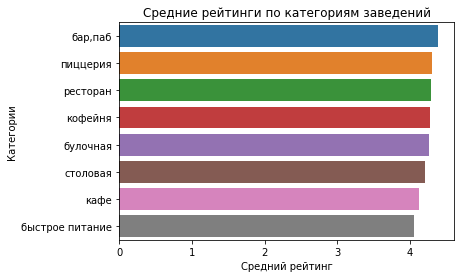

In [52]:
# построим график
ax = sns.barplot(x='rating', y='category', data=rating_df_c);

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Средние рейтинги по категориям заведений')
plt.xlabel('Средний рейтинг')
plt.ylabel('Категории')

plt.show()

Категория "бар,паб" находится на первом месте по средним рейтингам. Далее идут пиццерия, ресторан, кофейня и булочная. Самые низкие ретинги у столовых, кафе и быстрого питания.

In [53]:
# выведем общие средние рейтинги по районам
rating_df_d = df.groupby('district')['rating'].mean()
rating_df_d

district
Восточный административный округ           4.174185
Западный административный округ            4.181647
Северный административный округ            4.240980
Северо-Восточный административный округ    4.147978
Северо-Западный административный округ     4.208802
Центральный административный округ         4.377520
Юго-Восточный административный округ       4.101120
Юго-Западный административный округ        4.172920
Южный административный округ               4.184512
Name: rating, dtype: float64

In [54]:
# посмотрим на средние рейтинги по районам Москвы
rating_category = df.pivot_table(index = 'district',
                                   columns = 'category',
                                   values = 'rating',
                                   aggfunc = 'mean').reset_index()

rating_category.columns = ['Район Москвы', 'бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан','столовая']
rating_category

,Район Москвы,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,4.315094,4.168000,4.043662,4.098162,4.282857,4.269444,4.186875,4.232500
1,Западный административный округ,4.398000,4.264865,3.969355,4.075630,4.195333,4.288732,4.257339,4.112500
2,Северный административный округ,4.327941,4.253846,3.975862,4.185043,4.291710,4.292208,4.290426,4.217073
3,Северо-Восточный административный округ,4.187097,4.342857,4.032927,4.053532,4.216981,4.255882,4.209890,4.082500
4,Северо-Западный административный округ,4.391304,4.283333,3.950000,4.047826,4.325806,4.337500,4.292661,4.188889
5,Центральный административный округ,4.486264,4.372000,4.234483,4.302371,4.336449,4.411504,4.416119,4.315152
6,Юго-Восточный административный округ,4.200000,4.038462,3.925373,4.047872,4.225843,4.185455,4.156552,4.104000
7,Юго-Западный административный округ,4.350000,4.155556,4.086885,4.036975,4.283333,4.340625,4.225595,4.241176
8,Южный административный округ,4.276471,4.340000,4.101176,4.093939,4.232824,4.258904,4.212935,4.261364


Видим, что и по районам рейтинг по категориям кардинально не различается. Единственное - в ЦАО рейтинги стабильно немного выше по всем категориям, чем в остальных районах Москвы.

## Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [55]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df_d,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Хороплет подтверждает вышеуказанные выводы - ЦАО имеет самые высоки рейтинги. Далее САО и СЗАО.

## Все заведения датасета на карте с помощью кластеров

In [56]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаём маркер в текущей точке и добавляем его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Наблюдается наибольшее сосредоточение заведений в районе ЦАО.

## ТОП-15 улиц Москвы

In [57]:
# найдем ТОП-15 улиц
top_15_street = (df.groupby('street')['name']
          .agg('count').
          sort_values(ascending=False)
          .reset_index()
          )

top_15_street = top_15_street.nlargest(15,'name').reset_index(drop=True)
top_15_street

,street,name
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,76
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


In [58]:
# отфильтруем датасет по ТОП-15 улицам
# top_15_street_list - переменная со списком ТОП-15 улиц 
# funnel_1 - отфильтрованный датасет
top_15_street_list = ['проспект мира','профсоюзная улица','проспект вернадского','ленинский проспект','ленинградский проспект','дмитровское шоссе','каширское шоссе','варшавское шоссе','ленинградское шоссе','мкад','люблинская улица','улица вавилова','кутузовский проспект','улица миклухо-маклая','пятницкая улица']
funnel_1 = df.query('street == @top_15_street_list')


In [59]:
# построим сводную таблицу с данными по ТОП-15 улиц в разрезе категорий
report = funnel_1.pivot_table(index = 'street',columns = 'category',values = 'name',aggfunc = 'count').reset_index()

report

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
1,дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
2,каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,18.0,5.0
3,кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
4,ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
5,ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
6,ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
7,люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0
8,мкад,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0
9,проспект вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0


In [60]:
# проверим данные (табл. report) на наличие пропусков в %
pd.DataFrame(round(report.isna().mean()*100)).style.background_gradient('coolwarm')

,0
category,
street,0.000000
"бар,паб",0.000000
булочная,33.000000
быстрое питание,0.000000
кафе,0.000000
кофейня,0.000000
пиццерия,7.000000
ресторан,0.000000
столовая,20.000000


Скорее всего пропуски указывают на отсутствие точек по данным категориям на ТОП-15 улицах. Заменим пропуски на ноль.

In [61]:
# заменим пропуски в столбцaх на ноль
report['булочная'] = report['булочная'].fillna(0)
report['пиццерия'] = report['пиццерия'].fillna(0)
report['столовая'] = report['столовая'].fillna(0)

In [62]:
# перепроверим данные (табл. report) на наличие пропусков в %
pd.DataFrame(round(report.isna().mean()*100)).style.background_gradient('coolwarm')

,0
category,
street,0.000000
"бар,паб",0.000000
булочная,0.000000
быстрое питание,0.000000
кафе,0.000000
кофейня,0.000000
пиццерия,0.000000
ресторан,0.000000
столовая,0.000000


In [63]:
# объединим таблицы
total_report = report.merge(top_15_street, on='street')
total_report.sort_values(by='name', ascending=True)

,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,name
12,пятницкая улица,9.0,3.0,2.0,7.0,6.0,3.0,18.0,0.0,48
14,улица миклухо-маклая,3.0,0.0,4.0,21.0,4.0,2.0,15.0,0.0,49
3,кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0,54
13,улица вавилова,2.0,2.0,11.0,15.0,10.0,3.0,12.0,0.0,55
7,люблинская улица,5.0,0.0,5.0,26.0,11.0,1.0,10.0,2.0,60
8,мкад,1.0,0.0,9.0,45.0,4.0,0.0,5.0,1.0,65
5,ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0,70
0,варшавское шоссе,6.0,0.0,7.0,18.0,14.0,4.0,20.0,7.0,76
2,каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,18.0,5.0,76
1,дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88


In [64]:
# строим график 
name_c = ['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан','столовая']
top_15_street_c = ['пятницкая улица', 'улица миклухо-маклая','кутузовский проспект','улица вавилова','люблинская улица','мкад','ленинградское шоссе','варшавское шоссе','каширское шоссе','дмитровское шоссе','ленинградский проспект','ленинский проспект','проспект вернадского','профсоюзная улица','проспект мира']

fig = px.bar(total_report.sort_values(by='name', ascending=True), x=name_c, y=top_15_street_c, width=1000, height=1000,title="Распределение количества заведений и их категорий по ТОП-15 улицам", text='value')

fig.show()

Преобладающими категориями являются: кафе, кофейни и рестораны.

## Улицы, на которых находится только один объект общепита

In [65]:
# найдем число улиц с одним объектом общественного питания
# one_rest_1 - улицы с одним объектом общественного питания
one_rest_1 = (df.groupby('street')['name']
          .agg('count').
          sort_values(ascending=True)
          .reset_index()
          )
one_rest_1.columns=['street','cnt']

one_rest_point_1 = one_rest_1[one_rest_1['cnt'] == 1]
print(f'Число улиц с одним объектом питания: {one_rest_point_1.shape[0]}')

Число улиц с одним объектом питания: 457


Количество улиц с одним объектом общественного питания составляет 458, т.е. всего 5,4% от всего количества улиц с объектами общественного питания из анализируемого датасета.

In [66]:
# посмотрим в каких районах расположены улицы с одним объектом общественного питания
# district - районы, в которых расположены улицы с одним объектом общественного питания
district = (df.groupby(['street','district'])['name']
          .agg('count').
          sort_values(ascending=True)
          .reset_index()
          )
district.columns=['street','district','cnt']


In [67]:
# объединим таблицу с улицами и районами
# street_district - улицы с привязкой к районам
# funnel_2 - фильтр таблица с улицами и районами с одним объектом
street_district = one_rest_1.merge(district, on='street')
funnel_2 = street_district[street_district['cnt_x'] == 1]

In [68]:
# найдем количество улиц с одним заведением по районам
street_district_cnt = (funnel_2.
        groupby('district')['cnt_y']
        .agg('count')
        .sort_values(ascending=False)
        .to_frame()
        .reset_index()
        )

street_district_cnt

,district,cnt_y
0,Центральный административный округ,145
1,Северо-Восточный административный округ,55
2,Восточный административный округ,52
3,Северный административный округ,51
4,Южный административный округ,43
5,Юго-Восточный административный округ,39
6,Западный административный округ,35
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


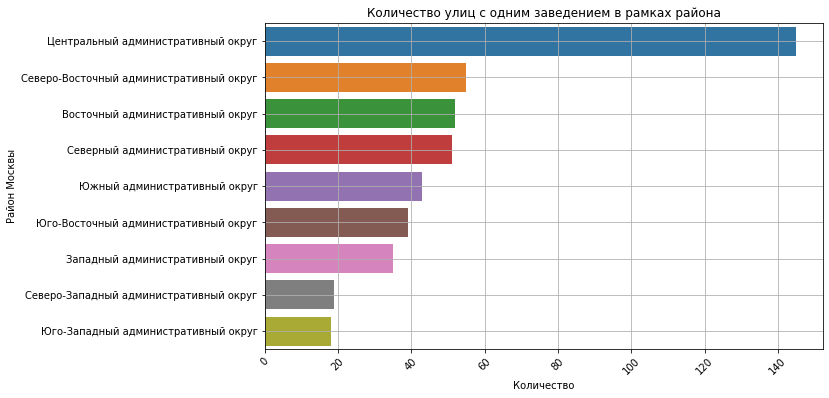

In [69]:
# строим график
plt.figure(figsize=(10,6))
ax = sns.barplot(x='cnt_y', y='district', data=street_district_cnt)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество улиц с одним заведением в рамках района')
plt.xlabel('Количество')
plt.ylabel('Район Москвы')

# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)

# добавляем сетку
plt.grid()

# отображаем график на экране
plt.show()

ЦАО является преобладающим районом с одним заведением на улице.
Возможные причины:
- короткая протяженность улицы
- высокая стоимость аренды
- нет разрешения на открытие заведений общественного питания (архитектурные проекты, представляющие культурную ценность; жилые дома)

## Ценовой индикатор района

In [70]:
# посчитаем медиану столбца middle_avg_bill для каждого района
# отфильтруем датасет от "заглушек"
filter_middle_avg_bill_for_district = df.query('middle_avg_bill != 999999')
middle_avg_bill_for_district = filter_middle_avg_bill_for_district.groupby('district')['middle_avg_bill'].median()
middle_avg_bill_for_district

district
Восточный административный округ            575.0
Западный административный округ            1000.0
Северный административный округ             650.0
Северо-Восточный административный округ     500.0
Северо-Западный административный округ      700.0
Центральный административный округ         1000.0
Юго-Восточный административный округ        450.0
Юго-Западный административный округ         600.0
Южный административный округ                500.0
Name: middle_avg_bill, dtype: float64

In [71]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
n = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_for_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    legend_name='Ценовой индикатор районов Москвы',
).add_to(n)

# выводим карту
n

Медиана цен в ЦАО значительно выше других районов Москвы, но также стоит отметить и ЗАО. Запад Москвы по-прежнему остается одним из самых престижных направлений (здесь много парков и мало промышленных предприятий).

Район с самым низким уровнем цен и самым высоким количеством промышленных объектовм - ЮВАО (район с предельным превышением в почве и воздухе допустимых концентраций вредных веществ).

Удалённость от центра прямо влияет на цены в заведениях.

## Часы работы заведений и их зависимость от расположения и категории заведения

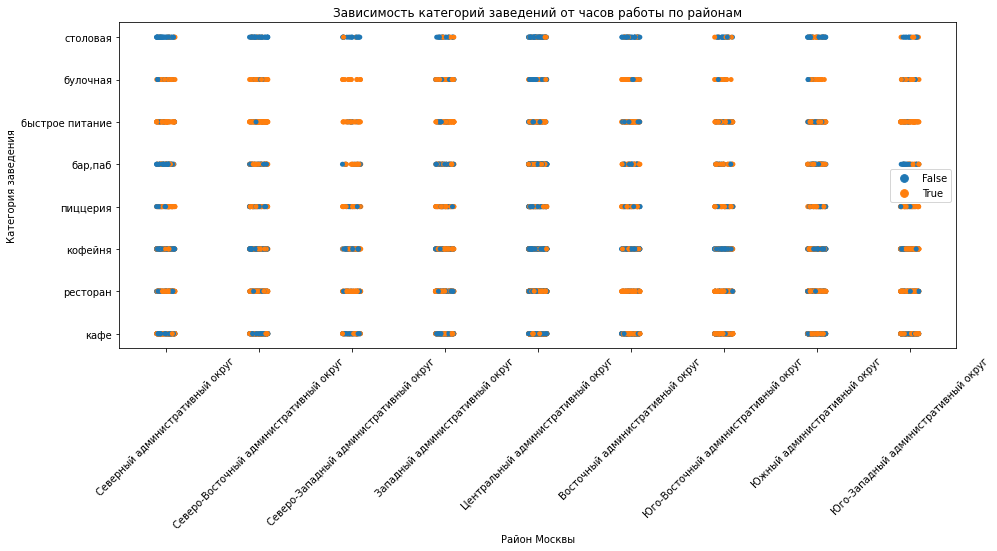

In [72]:
# строим график
plt.figure(figsize=(15,6))
sns.stripplot(x='district', y='category', data=df, hue = 'is_24/7')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Зависимость категорий заведений от часов работы по районам')
plt.xlabel('Район Москвы')
plt.ylabel('Категория заведения')

# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='right', fontsize=10)

# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45);

Видим, что, например, для ЦАО - не важен круглосуточный режим для категорий кофейня и пиццерия, зато для баров и ресторанов - да. Для категории столовая для всех районов не нужен круглосуточный режим в большинстве случаев, также и для большинства кофеин. 

## Выводы
- доля заведений общественного питания по количеству точек: кафе (28%), рестораны (24%), кофейни (почти 17%). Все остальные категории занимают менее 10%;
- 50% заведений имеют не более 75 посадочных мест;
- доля сетевых заведений составляет 38%;
- категории заведений, в которых превалирует тип "сеть": булочная, кофейня, пиццерия.;
- наиболее популярной категорией среди ТОП-15 популярных сетей является "кофейня" (33%);
- самая популярная локация заведений общественного питания - район ЦАО (27% от всего объема заведений). Далее примерно в равных долях - САО, ЮАО, СВАО и ЗАО. Остальные - ниже 10%;
- в ЦАО самой популярной категорией является "ресторан", далее примерно в одинаковой степени "кофейня" и "кафе", также стоит отметить популярность баров и пабов;
- район ЦАО имеет самые высоки рейтинги. Далее САО и СЗАО;
- количество улиц с одним объектом общественного питания составляет 5,4%;
- медиана цен в ЦАО значительно выше других районов Москвы, но также стоит отметить и ЗАО.
- для большинства кофеин не важен круглосуточный режим работы.

# 4. Детализация исследования

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. 

Итак, детализируем информацию для открытия кофейни.

## Количество кофеен и их расположение 

In [73]:
# отфильтруем датасет по кофейням
coffee_house = df.query('category == "кофейня"')

In [74]:
# выведем общую информацию
coffee_house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1413 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              1413 non-null   object 
 9   avg_bill           1413 non-null   object 
 10  middle_avg_bill    1413 non-null   float64
 11  middle_coffee_cup  1413 non-null   float64
 12  chain              1413 non-null   int64  
 13  seats              1413 non-null   int64  
 14  street             1413 non-null   object 
 15  is_24/7            1413 non-null   bool   
dtypes: bool(1), float64(5), 

In [75]:
# посчитаем количество кофеен для каждого района
coffee_house_cnt = coffee_house.groupby('district')['name'].count()
coffee_house_cnt

district
Восточный административный округ           105
Западный административный округ            150
Северный административный округ            193
Северо-Восточный административный округ    159
Северо-Западный административный округ      62
Центральный административный округ         428
Юго-Восточный административный округ        89
Юго-Западный административный округ         96
Южный административный округ               131
Name: name, dtype: int64

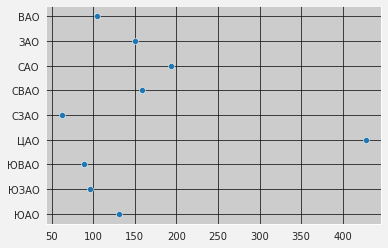

In [76]:
# построим график
# вручную задаём параметры графика
sns.set_style('darkgrid',
             {'axes.facecolor': '0.8',
              'grid.color': '0.1',
              'figure.facecolor': '0.95'})
# строим график scatter средствами seaborn
district = ['ВАО','ЗАО','САО','СВАО','СЗАО','ЦАО','ЮВАО','ЮЗАО','ЮАО']
value = [105,150,193,159,62,428,89,96,131]

sns.scatterplot(x=value, y=district, data=coffee_house_cnt)
# отображаем график на экране
plt.show()


Больше всего кофеин ожидаемо в районе ЦАО. Меньше всего - СЗАО.

## Круглосуточные кофейни

In [77]:
# найдем количество круглосуточных кофейн
coffee_house_time = coffee_house['is_24/7'].value_counts()
coffee_house_time

False    785
True     628
Name: is_24/7, dtype: int64

In [78]:
# найдем долю круглосуточных кофейн
coffee_house['is_24/7'].mean().round(2)

0.44

В Москве 44% кофейн работают ежедневно и круглосуточно.

In [79]:
# построим график
name_coffee = ['не круглосуточные', 'круглосуточные']
name_p = [785,628]
fig = go.Figure(data=[go.Pie(labels=name_coffee, # указываем значения, которые появятся на метках сегментов
                            values=name_p, # указываем данные, которые отобразятся на графике
                            pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Cоотношение круглосуточных и не круглосуточных кофейн', # указываем заголовок графика
                 width=600, # указываем размеры графика
                 height=600,
                 annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                   y=1.05,
                                   text='Часы работы',
                                   showarrow=False)])
fig.show() # выводим график



## Рейтинги кофейн по районам

In [80]:
# посчитаем средние рейтинги кофеен для каждого района
coffee_house_rating = coffee_house.groupby('district')['rating'].mean()
coffee_house_rating

district
Восточный административный округ           4.282857
Западный административный округ            4.195333
Северный административный округ            4.291710
Северо-Восточный административный округ    4.216981
Северо-Западный административный округ     4.325806
Центральный административный округ         4.336449
Юго-Восточный административный округ       4.225843
Юго-Западный административный округ        4.283333
Южный административный округ               4.232824
Name: rating, dtype: float64

In [81]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
l = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_house_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофейн по районам',
).add_to(l)

# выводим карту
l

Наиболее высокие рейтинги в категории "кофейня" у районов ЦАО и СВАО.

## Стоимость чашки капучино

In [82]:
# отфильтруем датасет по кофейням
cup_of_cappuccino = coffee_house.query('middle_coffee_cup != 999999')

# найдем количество улиц с одним заведением по районам
cup_of_cappuccino_district = (cup_of_cappuccino.
        groupby('district')['middle_coffee_cup']
        .agg('median')
        .sort_values(ascending=False)
        .to_frame()
        .reset_index()
        )

cup_of_cappuccino_district

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


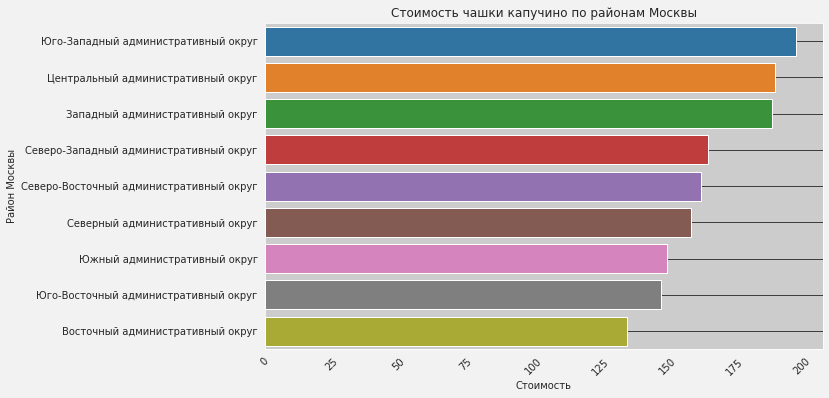

In [83]:
# строим график
plt.figure(figsize=(10,6))

ax = sns.barplot(x='middle_coffee_cup', y='district', data=cup_of_cappuccino_district)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Стоимость чашки капучино по районам Москвы')
plt.xlabel('Стоимость')
plt.ylabel('Район Москвы')

# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)

# добавляем сетку
plt.grid()

# отображаем график на экране
plt.show()

Самая дорогая чашка кофе в районе ЮЗАО (198 руб.), далее ЦАО и ЗАО (190 руб.) Дешевле всего стоимость в районе ВАО (135 руб.)

## Посадочные места в кофейнях

In [84]:
# отфильтруем датасет по кофейням
coffee_house_seats = coffee_house.query('seats != 999999')

perc_coffee_house = np.percentile(coffee_house_seats['seats'], [20,95])

print(f' у 80 % заведений более {perc_coffee_house[0]} посадочных мест,\n '
      f'у 5 % заведений более {perc_coffee_house[1]} посадочных мест')

 у 80 % заведений более 30.0 посадочных мест,
 у 5 % заведений более 320.0 посадочных мест


Основная масса кофеин имеет до 30 посадочных мест.

## Рекомендации для открытия кофейни

- район: ЦАО (самая популярная локация среди всех районов Москвы, доля 27%)
- улицы: Кутузовский проспект, Ленинградский проспект (входят в ТОП-15 улиц и категория "кофейня" развита.
- стоимость чашки кофе: не более 190 руб.
- количество посадочных мест: не более 30
- круглосуточный режим: не нужен

Дополнительно предлагается исследовать информацию по расположению бизнес-центров, учебных заведений и других крупных объектов с большим количеством людей.

# Презентация

Ссылка: 

https://disk.yandex.ru/d/Fe5d4v8svYcFXg